# Init

### libraries and clients

In [1]:
import sys
import os

# Get the current working directory (this should be the directory where the notebook is located)
current_dir = os.getcwd()

# Get the absolute path to the climate-change-assistant directory
climate_change_assistant_dir = os.path.abspath(os.path.join(os.getcwd(), '..'))

# Get the absolute path to the testing directory
testing_dir = os.path.abspath(os.path.join(current_dir, '..', 'testing'))

# Print the directories to verify the paths
print("Current Directory:", current_dir)
print("Climate Change Assistant Directory:", climate_change_assistant_dir)
print("Testing Directory:", testing_dir)

# Add the climate-change-assistant directory to the Python path if not already added
if climate_change_assistant_dir not in sys.path:
    sys.path.append(climate_change_assistant_dir)

# Add the testing directory to the Python path if not already added
if testing_dir not in sys.path:
    sys.path.append(testing_dir)

# Print the current Python path to verify the paths are included
print("Python Path:", sys.path)

# Now you can import the module
try:
    import testing_functions
    print("Module imported successfully.")
except ImportError as e:
    print("Error importing module:", e)


Current Directory: /teamspace/studios/this_studio/climate-change-assistant/sandbox
Climate Change Assistant Directory: /teamspace/studios/this_studio/climate-change-assistant
Testing Directory: /teamspace/studios/this_studio/climate-change-assistant/testing
Python Path: ['/teamspace/studios/this_studio/climate-change-assistant/sandbox', '/home/zeus/miniconda3/envs/cloudspace/lib/python310.zip', '/home/zeus/miniconda3/envs/cloudspace/lib/python3.10', '/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/lib-dynload', '', '/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages', '/teamspace/studios/this_studio/climate-change-assistant', '/teamspace/studios/this_studio/climate-change-assistant/testing']


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/diffusers/utils/outputs.py:63: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  torch.utils._pytree._register_pytree_node(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/diffusers/utils/outputs.py:63: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  torch.utils._pytree._register_pytree_node(


Module imported successfully.


In [2]:
print("Python Path:", sys.path)

Python Path: ['/teamspace/studios/this_studio/climate-change-assistant/sandbox', '/home/zeus/miniconda3/envs/cloudspace/lib/python310.zip', '/home/zeus/miniconda3/envs/cloudspace/lib/python3.10', '/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/lib-dynload', '', '/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages', '/teamspace/studios/this_studio/climate-change-assistant', '/teamspace/studios/this_studio/climate-change-assistant/testing', '/tmp/tmpf9zwp79y']


In [3]:
import uuid
import json
import pandas as pd
from arize.pandas.logger import Client
from arize.utils.types import (
    Environments,
    ModelTypes,
    EmbeddingColumnNames,
    Schema,
    PromptTemplateColumnNames,
    LLMConfigColumnNames,
    LLMRunMetadataColumnNames,
    CorpusSchema,
)
from datetime import datetime

In [4]:
import os
import json
import pandas as pd
from PIL import Image
from io import BytesIO

import requests
from openai import OpenAI
from openai import AsyncOpenAI
from datetime import date
from datetime import datetime

from dotenv import load_dotenv
import sys
import time

import prompts as pr
import assistant_tools as at
import testing_functions as tf # switched from helper_functions to testing_functions to do dev on a side branch, so to speak

pf_api_url = "https://graphql.probablefutures.org"
#pf_token_audience = "https://graphql.probablefutures.com"
#pf_token_url = "https://probablefutures.us.auth0.com/oauth/token"

api_key = os.environ.get("OPENAI_API_KEY")
client = AsyncOpenAI(api_key=api_key)

load_dotenv()

True

In [5]:
 # https://huggingface.co/playgroundai/playground-v2.5-1024px-aesthetic

In [8]:
from diffusers import DiffusionPipeline
from diffusers import AutoPipelineForText2Image, AutoPipelineForImage2Image
import torch

pipeline_image2image = DiffusionPipeline.from_pretrained("playgroundai/playground-v2.5-1024px-aesthetic", torch_dtype=torch.float16, variant="fp16").to("cuda")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'latents_mean': [-1.6574, 1.886, -1.383, 2.5155], 'latents_std': [8.4927, 5.9022, 6.5498, 5.2299]} were passed to AutoencoderKL, but are not expected and will be ignored. Please verify your config.json configuration file.


AttributeError: module diffusers has no attribute EDMDPMSolverMultistepScheduler

In [52]:
image_path = 'climatecon!images/IMG_0323_2.jpg'
#image_path = 'climatecon!images/test.jpg'
keywords_prompt = '''
DJ on stage, speaking, with microphone, audiences, clapping, cheering, solarpunk
'''

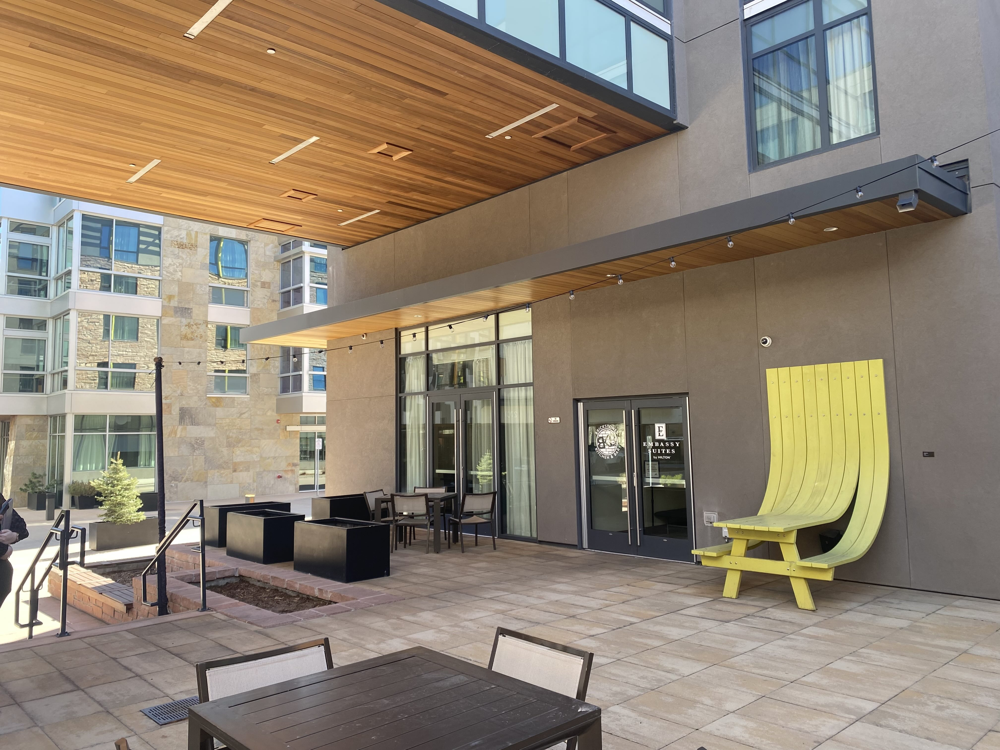

In [53]:
img = Image.open(image_path)
img

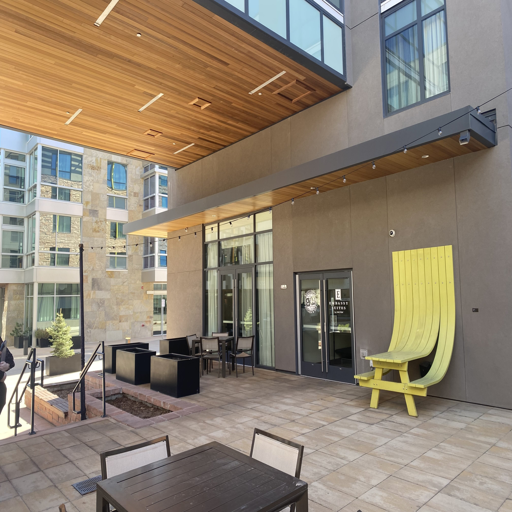

In [54]:
resized_img = img.resize((512, 512))

# Display the resized image inline in the Jupyter notebook
display(resized_img)

In [73]:
result_image = pipeline_image2image(prompt=keywords_prompt, image=resized_img, strength=0.50, guidance_scale=3, num_inference_steps=50).images[0]

  0%|          | 0/1 [00:00<?, ?it/s]

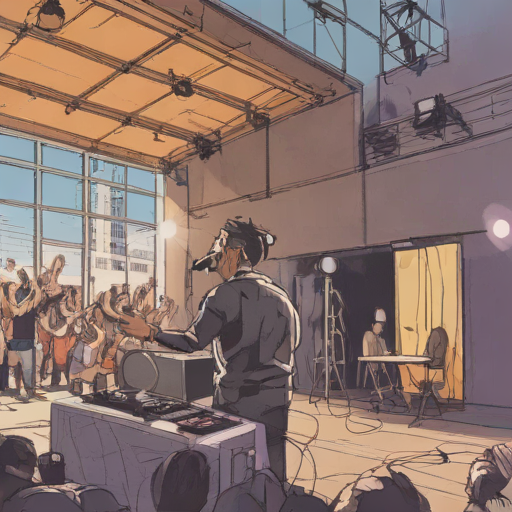

In [74]:
result_image